In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import os
from owi_data_2_pandas.io import API
import datetime
from pytz import utc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import matplotlib.dates as mdates

# sklearn imports
from sklearn.model_selection import train_test_split

# oma_tracking imports
from oma_tracking.data.preprocessing import sin_cos_angle_inputs

# Import vub Meetenet Vlaamse Banken API functions
from vubmvbc.config import Credentials
from vubmvbc.client import Base
from vubmvbc.objects import Catalog, Data
import vubmvbc.data_getter as dg

from oma_tracking.oma_clustering import ModeClusterer  #pip install hdbscan --no-build-isolation --no-binary :all
from oma_tracking.data.make_dataset import DatasetGetter
from oma_tracking.data.utils import unpack_mode, get_frequencies, get_rated_data, get_parked_data, read_simulations_csv_files

In [5]:
start  = datetime.datetime(2012,1,1,tzinfo=utc)
stop  = datetime.datetime(2023,7,19,tzinfo=utc)

location = 'bbc01'
name_location = 'BB_C01'

home_folder = "../../"
data_file_name = '_'.join([location, start.strftime("%Y%m%d"), stop.strftime("%Y%m%d")])
data_path = home_folder + "data/bb/raw/" + data_file_name + ".parquet"
data = pd.read_parquet(data_path)


SS1 = get_frequencies(data, 'SS1')
SS2 = get_frequencies(data, 'SS2')
FA1 = get_frequencies(data, 'FA1')

In [25]:
weather_data_path = "../../data/nw2/mvbc_data_longterm.parquet"
Thorntonbank_data_path = "../../data/nw2/Thorntonbank_data_longterm.parquet"
Westhinder_data_path = "../../data/nw2/Westhinder_data_longterm.parquet"

weather_data = pd.read_parquet(weather_data_path)

scada_inputs = data.filter(regex='mean')

inputs = \
    pd.concat(
        [
            weather_data,
            scada_inputs
        ],
        axis=1
    )

inputs = sin_cos_angle_inputs(inputs)

selected_columns = \
    [
       #'mvbc_WandelaarBuoy_10%_highest_waves',
       #'mvbc_WandelaarBuoy_Wave_height',
       #'mvbc_WandelaarBuoy_Average_wave_period',
       #'mvbc_WandelaarMeasuringpile_Tide_TAW',
       #'mvbc_WandelaarMeasuringpile_Air_pressure',
       #'mvbc_WandelaarMeasuringpile_Air_temperature',
       #'mvbc_Wandelaar_Sea_water_temperature',
       'Sea_water_temperature',
       'Wave_height',
       'Tide_TAW',
       'Average_wave_period',
       'mean_'+ name_location + '_rpm',
       'mean_'+ name_location + '_yaw',
       'mean_'+ name_location + '_pitch',
       'mean_'+ name_location + '_power',
       'mean_'+ name_location + '_windspeed',
       'mean_'+ name_location + '_winddirection'
    ]
inputs = inputs[selected_columns]

AttributeError: 'numpy.ndarray' object has no attribute 'filter'

C:\Users\Max\AppData\Local\Temp\ipykernel_31048\1052292621.py:134: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cbar.draw_all()


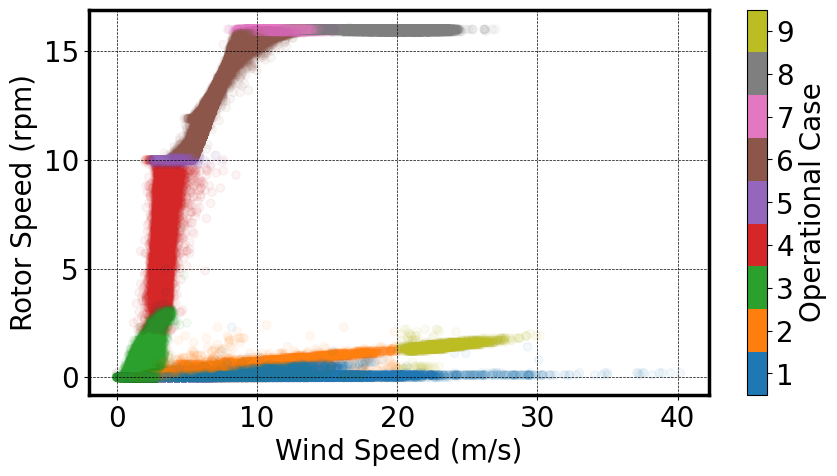

In [ ]:
### Multiple Linear Regression
# define the 6 operational cases

inputs['operational_case'] = np.nan

cutout_windspeed = 25
windspeed5 = 5
windspeed20 = 20
windspeed2_5 = 2.5
windspeed7_5 = 7.5
windspeed15_5 = 15.5

pitch_1 = -1
pitch19 = 19
pitch19_5 = 19.5
pitch20_5 = 20.5
pitch70 = 70
pitch80 = 80
pitch100 = 100
pitch_20 = -20
pitch1 = 1
pitch70 = 70

rpm2_5 = 2.5
rpm10 = 10
rpm2_05 = 2.05
rpm9_8 = 9.8
rpm10_2 = 10.2
rpm15_9 = 15.9
rpm17 = 17
rpm2_2 = 2.2

power2950 = 2950
power2920 = 2920

# Case 1: parked
inputs['operational_case'] = np.where(
    (inputs.filter(regex='rpm') <= rpm2_5).values[:,0] \
    & (inputs.filter(regex='pitch') >= pitch80).values[:,0] \
    & (inputs.filter(regex='pitch') <= pitch100).values[:,0],
    1,
    inputs['operational_case']
)

# Case 2: pitch:80
inputs['operational_case'] = np.where(
    (inputs.filter(regex='rpm') <= rpm2_5).values[:,0] \
    & (inputs.filter(regex='pitch') >= pitch70).values[:,0] \
    & (inputs.filter(regex='pitch') <= pitch80).values[:,0] \
    & (inputs.filter(regex='windspeed') <= windspeed20).values[:,0],
    2,
    inputs['operational_case']
)

# Case 3: pitch:20
inputs['operational_case'] = np.where(
    (inputs.filter(regex='pitch') >= pitch19_5).values[:,0] \
    & (inputs.filter(regex='pitch') <= pitch20_5).values[:,0] \
    & (inputs.filter(regex='windspeed') <= windspeed5).values[:,0],
    3,
    inputs['operational_case']
)

# Case 4: rpm<10
inputs['operational_case'] = np.where(
    (inputs.filter(regex='rpm') >= rpm2_05).values[:,0] \
    & (inputs.filter(regex='rpm') <= rpm10).values[:,0] \
    & (inputs.filter(regex='pitch') >= pitch_1).values[:,0] \
    & (inputs.filter(regex='pitch') <= pitch19).values[:,0],
    4,
    inputs['operational_case']
)

# Case 5: rpm:10
inputs['operational_case'] = np.where(
    (inputs.filter(regex='rpm') >= rpm9_8).values[:,0] \
    & (inputs.filter(regex='rpm') <= rpm10_2).values[:,0] \
    & (inputs.filter(regex='windspeed') >= windspeed2_5).values[:,0] \
    & (inputs.filter(regex='windspeed') <= windspeed7_5).values[:,0],
    5,
    inputs['operational_case']
)

# Case 6: rpm<16
inputs['operational_case'] = np.where(
    (inputs.filter(regex='rpm') >= rpm10_2).values[:,0] \
    & (inputs.filter(regex='rpm') <= rpm15_9).values[:,0] \
    & (inputs.filter(regex='pitch') > pitch_20).values[:,0] \
    & (inputs.filter(regex='pitch') < pitch1).values[:,0],
    6,
    inputs['operational_case']
)

# Case 7: Rated RPM
inputs['operational_case'] = np.where(
    (inputs.filter(regex='rpm') >= rpm15_9).values[:,0] \
    & (inputs.filter(regex='rpm') <= rpm17).values[:,0] \
    & (inputs.filter(regex='windspeed') <= windspeed15_5).values[:,0] \
    & (inputs.filter(regex='power') <= power2950).values[:,0],
    7,
    inputs['operational_case']
)

# Case 8: Rated Power
inputs['operational_case'] = np.where(
    (inputs.filter(regex='rpm') >= rpm15_9).values[:,0] \
    & (inputs.filter(regex='rpm') <= rpm17).values[:,0] \
    & (inputs.filter(regex='power') >= power2920).values[:,0],
    8,
    inputs['operational_case']
)

# Case 9: Cutout
inputs['operational_case'] = np.where(
    (inputs.filter(regex='pitch') > pitch70).values[:,0] \
    & (inputs.filter(regex='pitch') < pitch80).values[:,0] \
    & (inputs.filter(regex='windspeed') > windspeed20).values[:,0] \
    & (inputs.filter(regex='rpm') <= rpm2_2).values[:,0],
    9,
    inputs['operational_case']
)

import matplotlib

plt.rcParams.update({'font.size': 20})

fig, ax = plt.subplots(figsize=(10, 5))
cmap = matplotlib.colors.ListedColormap(plt.cm.tab10.colors[:len(inputs['operational_case'].unique())-1])
plt.scatter(inputs.filter(regex='windspeed').values[:,0], inputs.filter(regex='rpm').values[:,0], alpha=0.05, c=inputs['operational_case'], cmap=cmap)
# Add the colorbar with alpha = 1
cbar = plt.colorbar()
cbar.ax.set_ylabel('Operational Case')
cbar.set_alpha(1)
cbar.draw_all()
tick_locs = np.linspace(int(inputs['operational_case'].min()), int(inputs['operational_case'].max()), int(2 * len(inputs['operational_case'].unique()) -1 ))[1::2]
cbar_tick_label = np.arange(int(inputs['operational_case'].min()), int(inputs['operational_case'].max() + 1))
cbar.set_ticks(tick_locs)
cbar.set_ticklabels(cbar_tick_label)

# Increase the width of the spines
ax.spines['left'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['top'].set_linewidth(2.5)

plt.grid(True, color='k', linestyle='--', linewidth=0.5)

plt.xlabel('Wind Speed (m/s)')
plt.ylabel('Rotor Speed (rpm)')
plt.show()

In [ ]:
parked_data = get_parked_data(data)
parked_SS2 = get_frequencies(parked_data, 'SS2')
days = parked_SS2.groupby(parked_SS2.index.date).count()[parked_SS2.groupby(parked_SS2.index.date).count() > 144*0.2].dropna().index
parked_SS2['date'] = parked_SS2.index.date
parked_SS2_longterm = parked_SS2[np.isin(parked_SS2['date'], days)].drop(columns=['date'])

from sklearn.cluster import DBSCAN

time_difference = (parked_SS2_longterm.index-parked_SS2_longterm.index[0]).total_seconds()/60
parked_SS2_longterm['time_difference'] = time_difference
clustering = DBSCAN(eps=60*24*14, min_samples=2).fit(parked_SS2_longterm['time_difference'].values.reshape(-1, 1) )
parked_SS2_longterm['cluster'] = clustering.labels_

big_clusters = parked_SS2_longterm.groupby('cluster').count()[parked_SS2_longterm.groupby('cluster').count()>144].dropna().index
parked_SS2_longterm_big_clusters = parked_SS2_longterm[np.isin(parked_SS2_longterm['cluster'], big_clusters)]
unique_vals = parked_SS2_longterm_big_clusters['cluster'].unique()
parked_SS2_longterm_big_unique_clusters = parked_SS2_longterm_big_clusters['cluster'].replace(to_replace=unique_vals,
           value= list(range(len(unique_vals))),
           inplace=True)

C:\Users\Max\AppData\Local\Temp\ipykernel_31048\928439723.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  parked_SS2_longterm_big_unique_clusters = parked_SS2_longterm_big_clusters['cluster'].replace(to_replace=unique_vals,


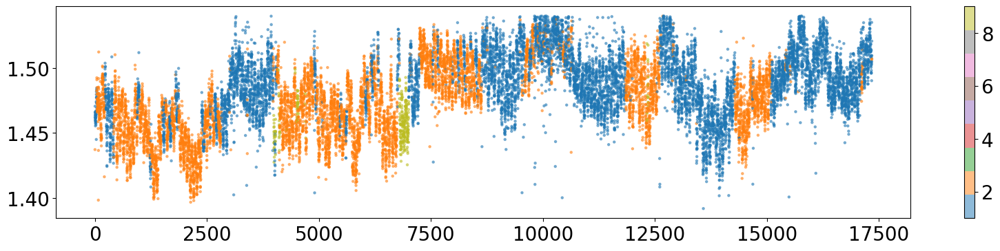

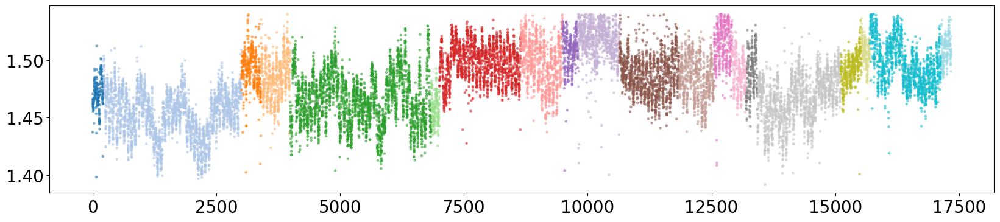

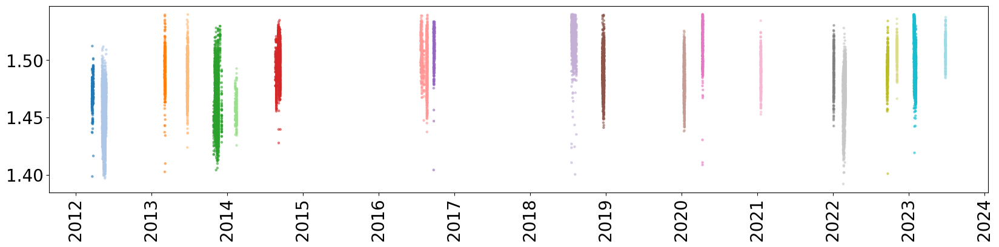

In [ ]:
import matplotlib.dates as mdates

plt.figure(figsize = (20,4))
cmap = matplotlib.colors.ListedColormap(plt.cm.tab10.colors[:len(inputs['operational_case'].unique())-1])
plt.scatter(range(len(parked_SS2_longterm_big_clusters)),
            parked_SS2_longterm_big_clusters['mean_frequency'].values,
            c=inputs['operational_case'].loc[parked_SS2_longterm_big_clusters.index],
            s=5,
            alpha=0.5,
            cmap=cmap)
cbar = plt.colorbar()
plt.show()
plt.figure(figsize = (20,4))
plt.scatter(range(len(parked_SS2_longterm_big_clusters)), parked_SS2_longterm_big_clusters['mean_frequency'].values, c=parked_SS2_longterm_big_clusters['cluster'].values, s=5, alpha=0.5, cmap='tab20')
plt.show()
plt.figure(figsize = (20,4))
plt.scatter(parked_SS2_longterm_big_clusters.index, parked_SS2_longterm_big_clusters['mean_frequency'].values, c=parked_SS2_longterm_big_clusters['cluster'].values, s=5, alpha=0.5, cmap='tab20')
# Get the current axes
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=90)
plt.show()

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from oma_tracking.models.virtual_ensemble import VirtualEnsembleXGB


# Split the data into input features (X) and target variable (y)
y = parked_SS2_longterm_big_clusters['mean_frequency'].dropna()
X = inputs[selected_columns].loc[y.index].dropna()
y = y.loc[X.index]
print(X.shape, y.shape)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)


# Example usage
n_estimators = 20

xgb_model = xgb.XGBRegressor(n_estimators=n_estimators)
xgb_model.fit(X, y)

n_submodels = int(n_estimators/2)
ensemble_model = VirtualEnsembleXGB(xgb_model, n_submodels)
predictions = ensemble_model.predict(X)
mean_predictions = ensemble_model.mean_predictions(X)
std_predictions = ensemble_model.std_predictions(X)

(17249, 10) (17249,)


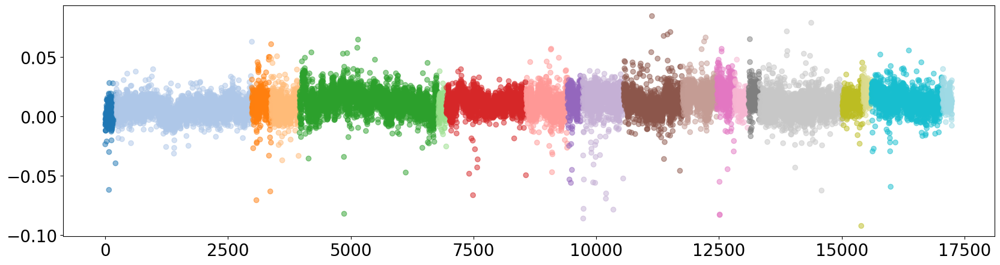

In [ ]:
residuals = y - mean_predictions
plt.figure(figsize=(20,5))
plt.scatter(range(len(residuals)), residuals.values, alpha=0.5, c=parked_SS2_longterm_big_clusters['cluster'].loc[y.index].values, cmap='tab20')

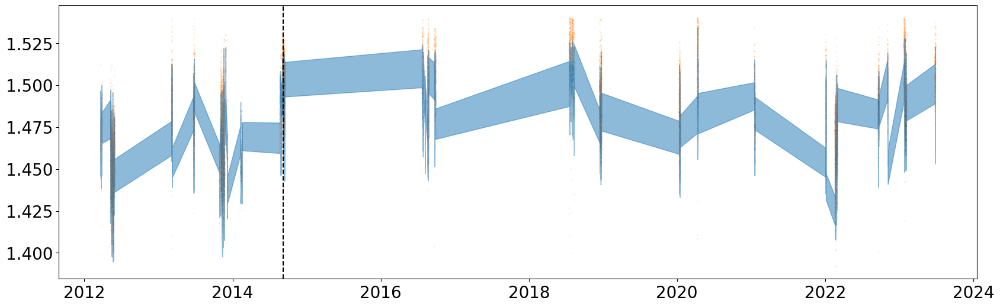

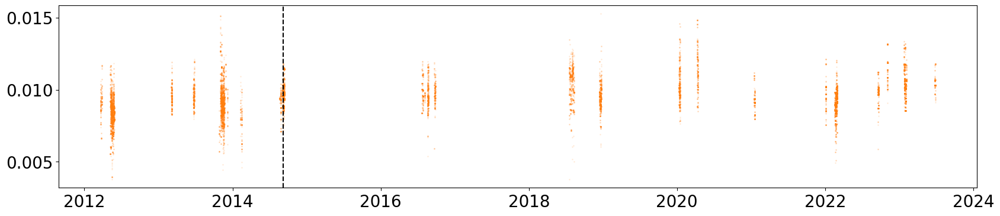

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20,6))
plt.scatter(y.index, y, alpha=0.1, color='tab:orange', s=1)
plt.scatter(y.index, mean_predictions, alpha=0.01, s=1)
plt.fill_between(y.index, mean_predictions-std_predictions, mean_predictions+std_predictions, alpha = 0.5, color = 'tab:blue')
plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

plt.figure(figsize=(20,4))
plt.scatter(y.index, std_predictions, alpha=0.1, color='tab:orange', s=1)
plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

In [ ]:
import catboost as cb
cb_regr = cb.CatBoostRegressor(verbose=200, posterior_sampling=True,
                          loss_function='RMSEWithUncertainty', iterations=500, learning_rate=0.05, depth=4, l2_leaf_reg=1, random_seed=42)
cb_regr.fit(X, y)

0:	learn: -2.2157763	total: 158ms	remaining: 1m 18s
200:	learn: -3.0621758	total: 3.6s	remaining: 5.35s
400:	learn: -3.1754764	total: 5.98s	remaining: 1.48s
499:	learn: -3.2231481	total: 6.95s	remaining: 0us


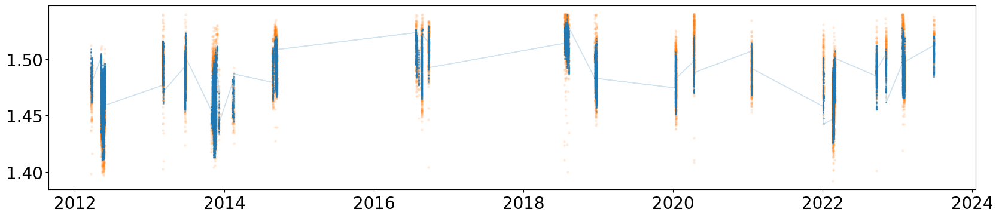

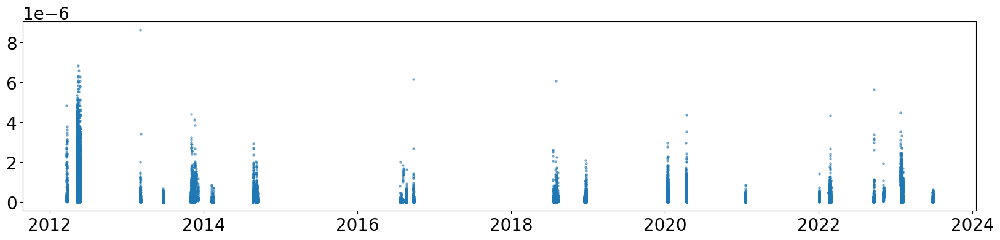

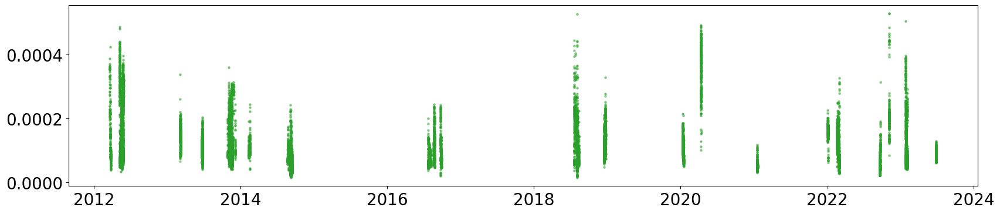

In [ ]:
preds = cb_regr.virtual_ensembles_predict(X, prediction_type='TotalUncertainty', 
                                        virtual_ensembles_count=200)

mean_preds = preds[:,0] # mean values predicted by a virtual ensemble
knowledge = preds[:,1] # knowledge uncertainty predicted by a virtual ensemble
data = preds[:,2] # average estimated data uncertainty

plt.figure(figsize=(20,4))
plt.scatter(y.index, y, alpha=0.1, color='tab:orange', s=5)
plt.scatter(y.index, mean_preds, alpha=0.5, color='tab:blue', s=1)
plt.fill_between(y.index, mean_preds-knowledge, mean_preds+knowledge, alpha = 0.2, color = 'tab:blue')
#plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

plt.figure(figsize=(20,4))
plt.scatter(y.index, knowledge, alpha=0.5, color='tab:blue',s=5)
#plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

plt.figure(figsize=(20,4))
plt.scatter(y.index, data, alpha=0.5, color='tab:green',s=5)
#plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

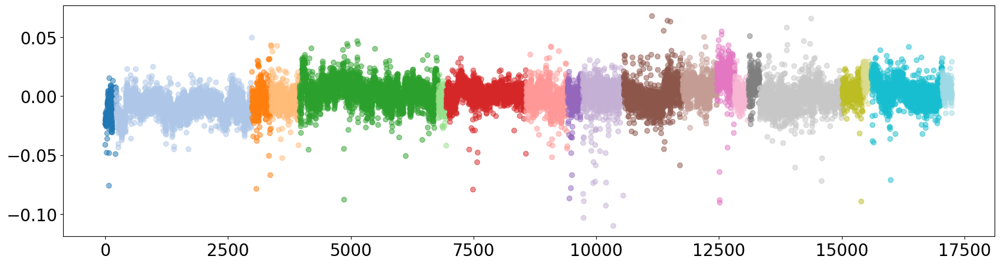

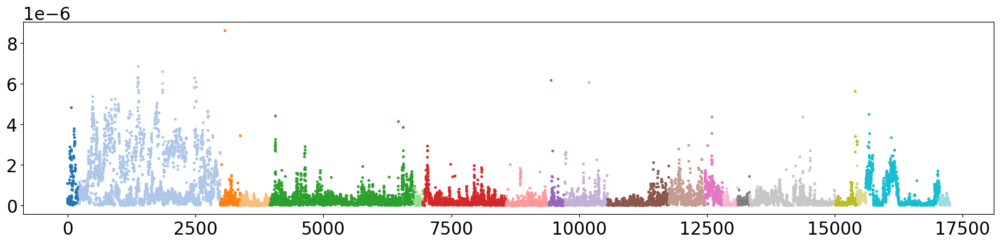

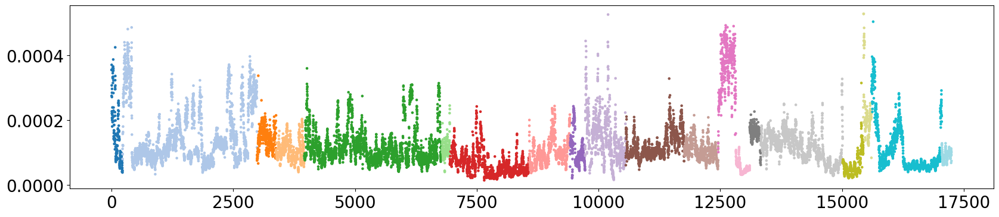

In [ ]:
residuals_cb = y - mean_preds
plt.figure(figsize=(20,5))
plt.scatter(range(len(residuals_cb)), residuals_cb.values, alpha=0.5, c=parked_SS2_longterm_big_clusters['cluster'].loc[y.index].values, cmap='tab20')

plt.figure(figsize=(20,4))
plt.scatter(range(len(knowledge)), knowledge, c=parked_SS2_longterm_big_clusters['cluster'].loc[y.index].values, cmap='tab20',s=5)
#plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

plt.figure(figsize=(20,4))
plt.scatter(range(len(data)), data, c=parked_SS2_longterm_big_clusters['cluster'].loc[y.index].values, cmap='tab20',s=5)
#plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

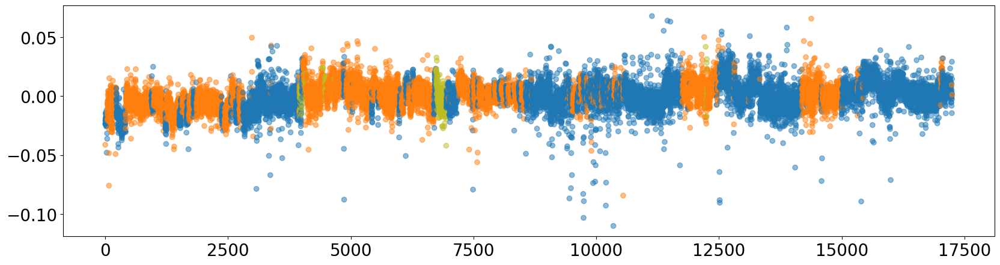

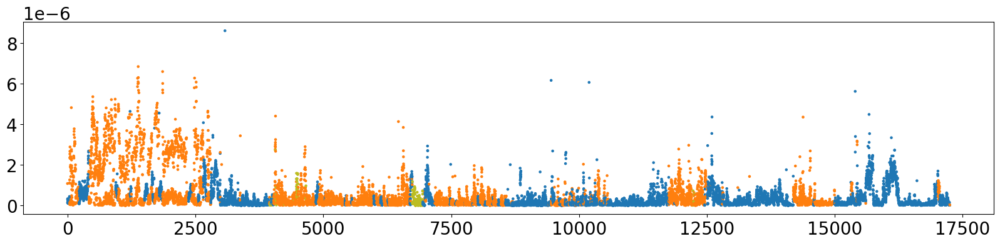

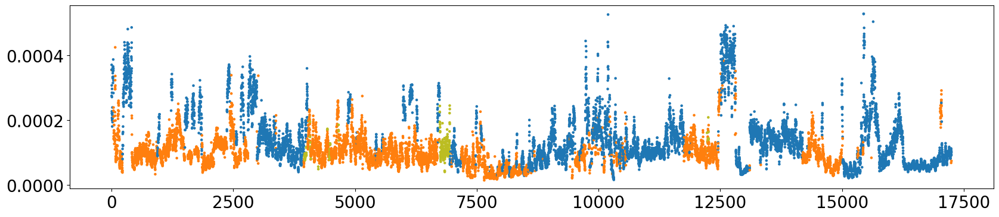

In [ ]:
cmap = matplotlib.colors.ListedColormap(plt.cm.tab10.colors[:len(inputs['operational_case'].unique())-1])

residuals_cb = y - mean_preds
plt.figure(figsize=(20,5))
plt.scatter(range(len(residuals_cb)), residuals_cb.values, alpha=0.5, c=inputs['operational_case'].loc[y.index],cmap=cmap)

plt.figure(figsize=(20,4))
plt.scatter(range(len(knowledge)), knowledge, c=inputs['operational_case'].loc[y.index],cmap=cmap,s=5)
#plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

plt.figure(figsize=(20,4))
plt.scatter(range(len(data)), data, c=inputs['operational_case'].loc[y.index],cmap=cmap,s=5)
#plt.axvline(x=X_test.index[0], color='k', linestyle='--')
plt.show()

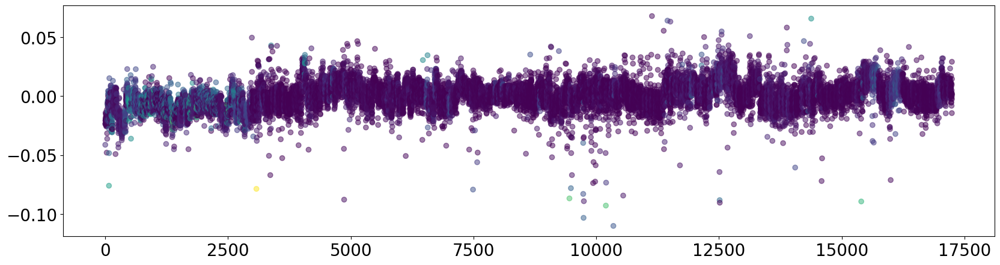

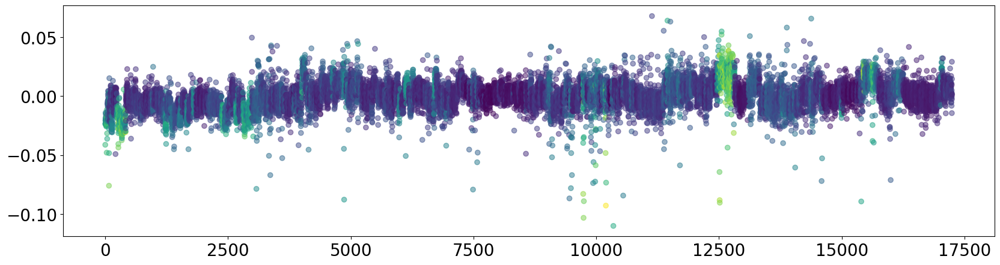

In [ ]:
residuals_cb = y - mean_preds
plt.figure(figsize=(20,5))
plt.scatter(range(len(residuals_cb)), residuals_cb.values, alpha=0.5, c=knowledge)
plt.show()

plt.figure(figsize=(20,5))
plt.scatter(range(len(residuals_cb)), residuals_cb.values, alpha=0.5, c=data)
plt.show()

Sea_water_temperature


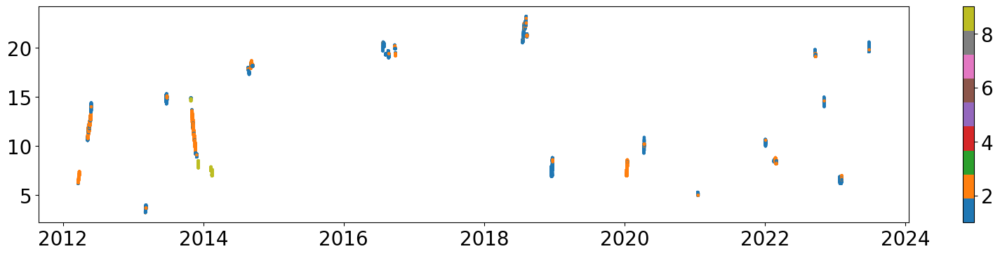

Wave_height


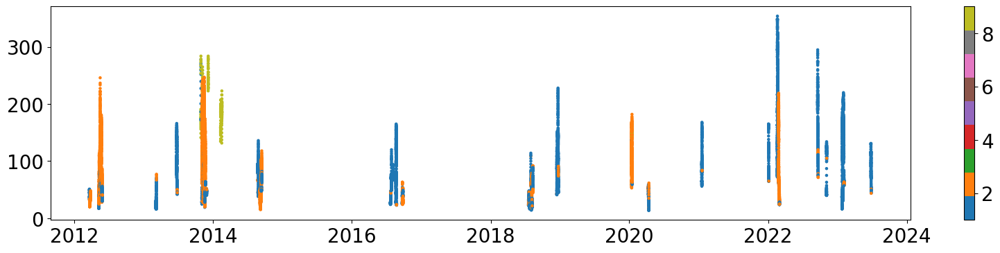

Tide_TAW


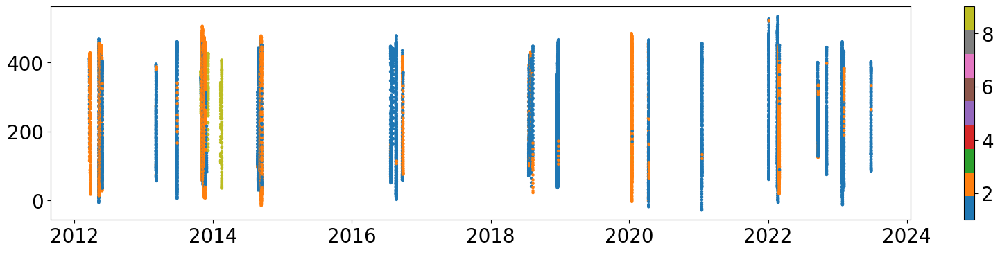

Average_wave_period


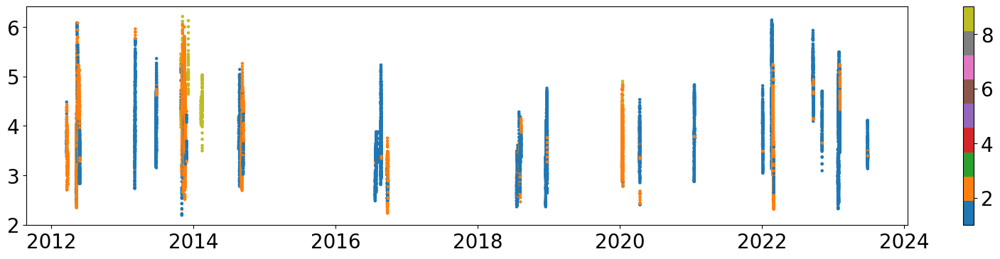

mean_BB_C01_rpm


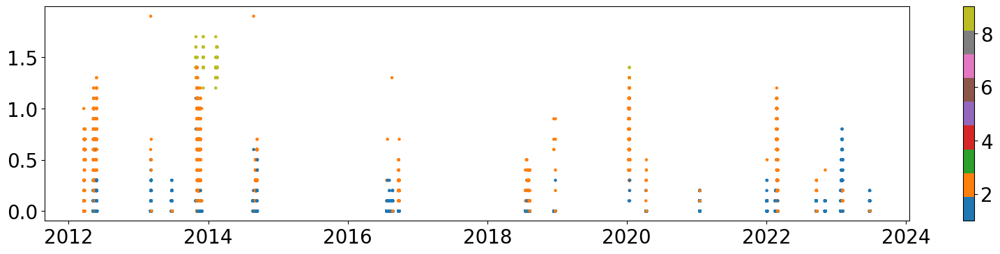

mean_BB_C01_yaw


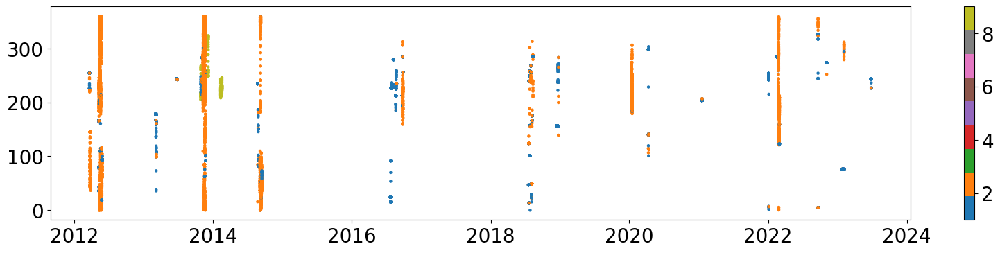

mean_BB_C01_pitch


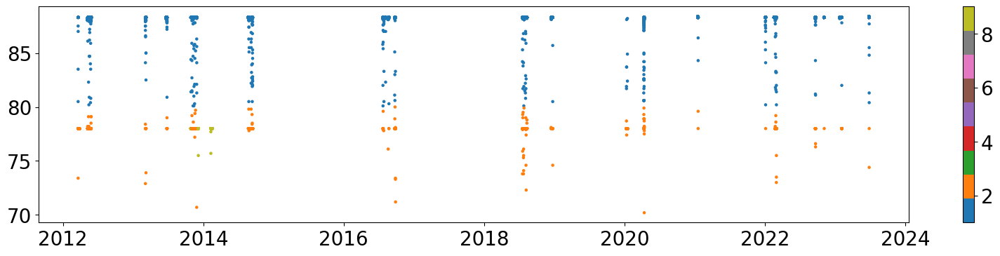

mean_BB_C01_power


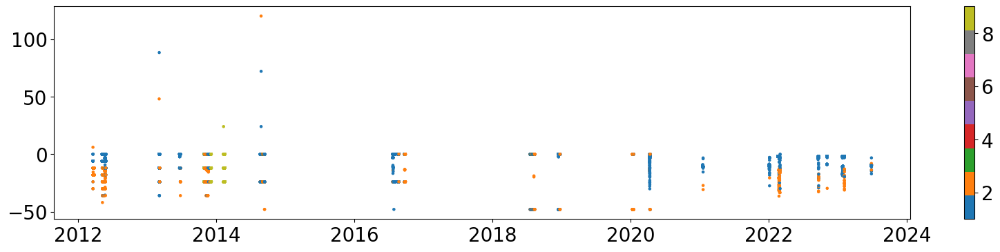

mean_BB_C01_windspeed


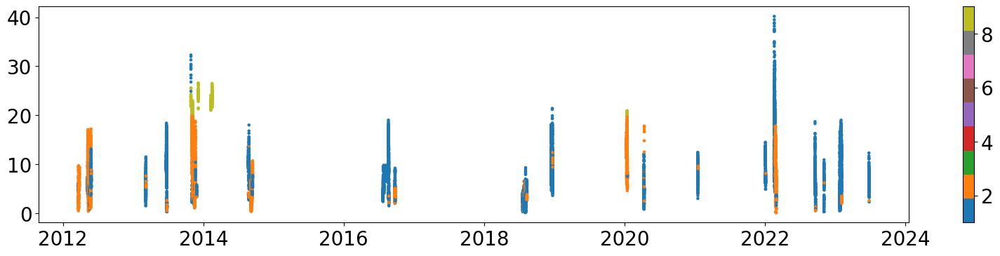

mean_BB_C01_winddirection


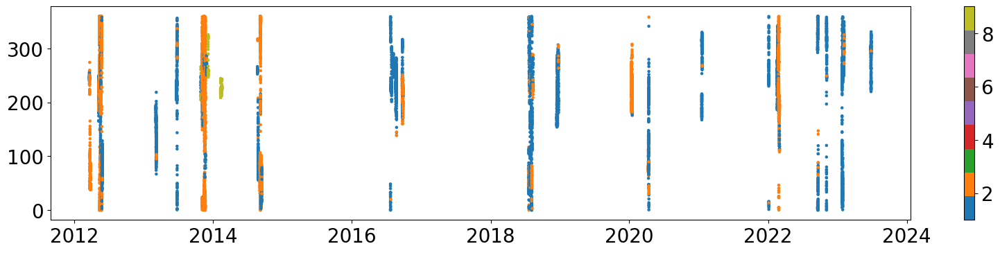

In [ ]:
cmap = matplotlib.colors.ListedColormap(plt.cm.tab10.colors[:len(inputs['operational_case'].unique())-1])
for column in X.columns:
    print(column)
    plt.figure(figsize=(20,4))
    plt.scatter(y.index, X[column].loc[y.index], c=inputs['operational_case'].loc[y.index],cmap=cmap,s=5)
    cbar = plt.colorbar()
    plt.show()

Sea_water_temperature


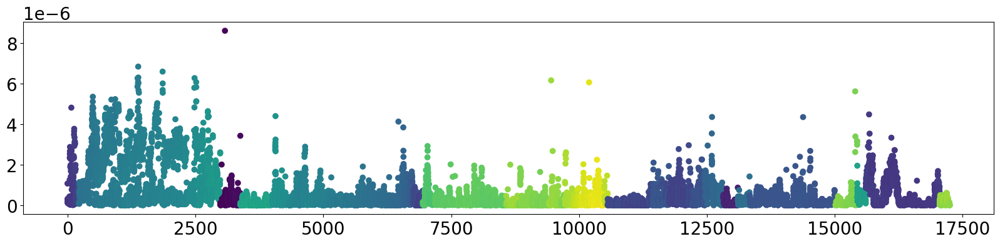

Wave_height


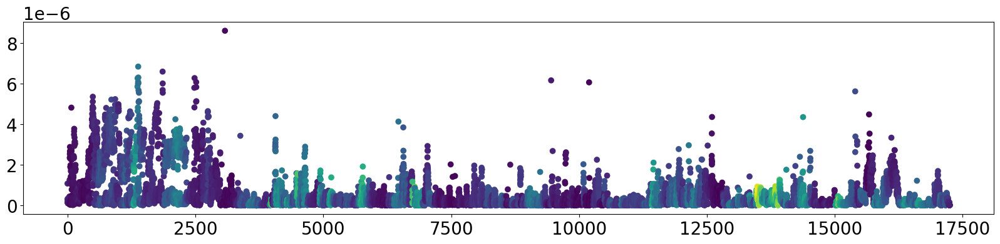

Tide_TAW


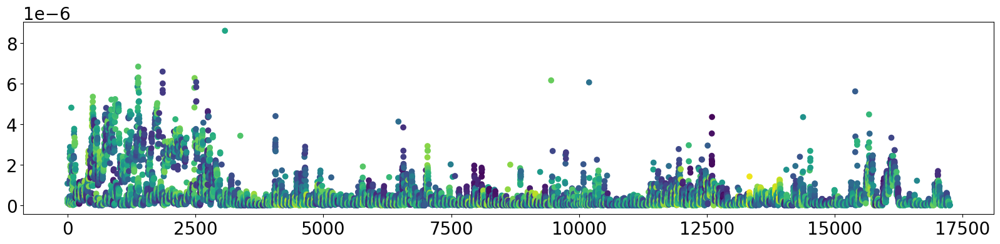

Average_wave_period


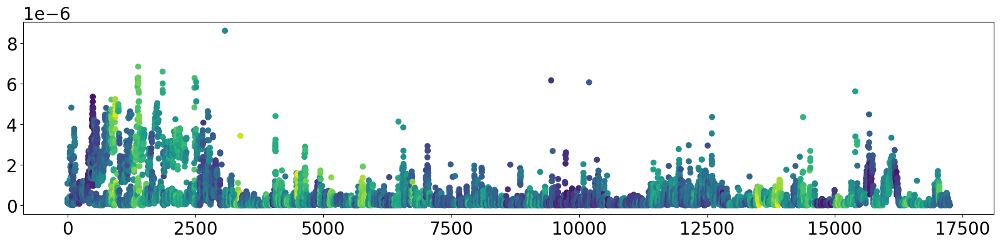

mean_BB_C01_rpm


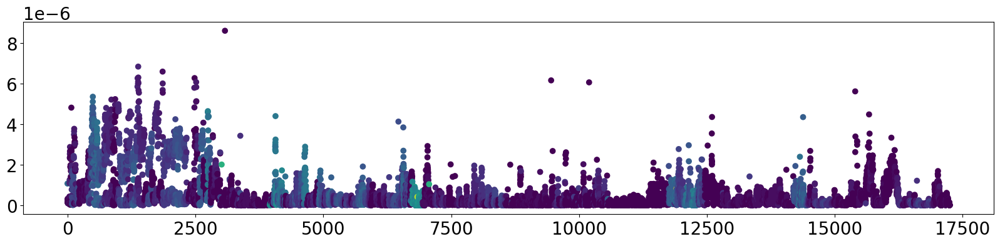

mean_BB_C01_yaw


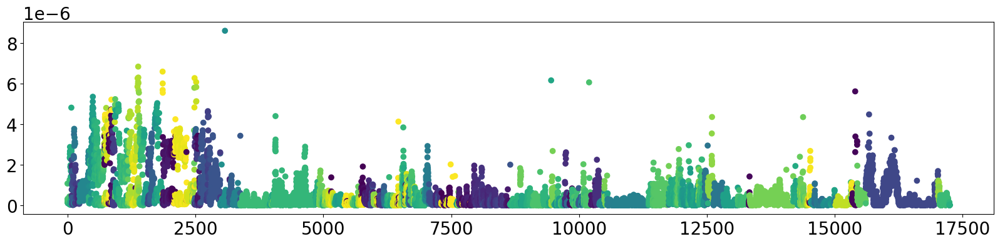

mean_BB_C01_pitch


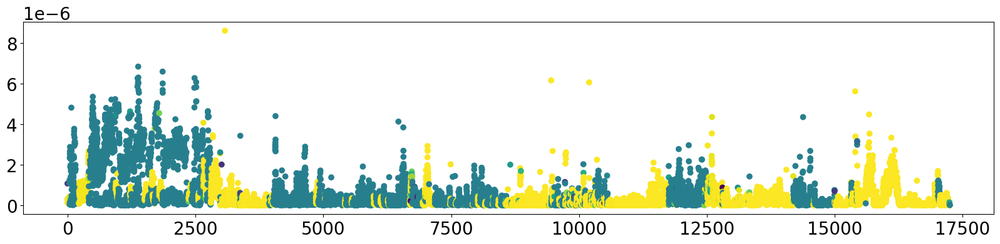

mean_BB_C01_power


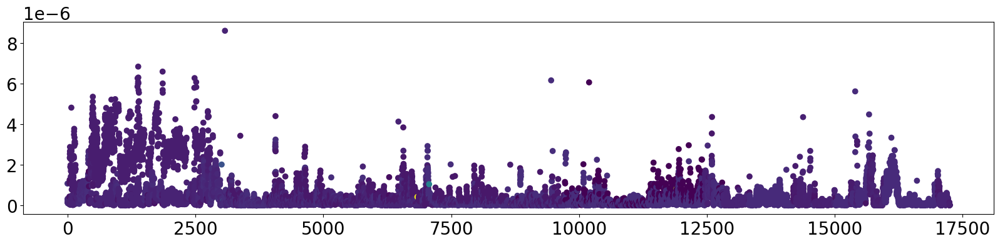

mean_BB_C01_windspeed


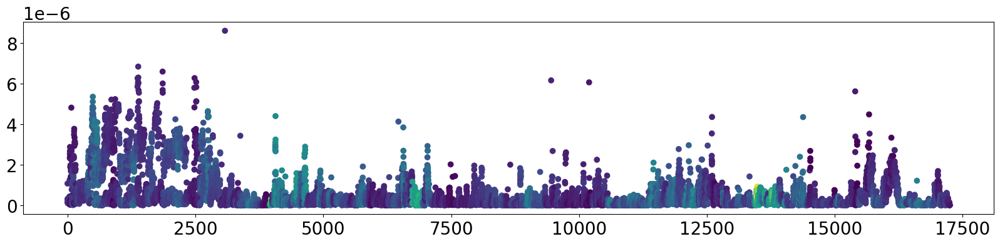

mean_BB_C01_winddirection


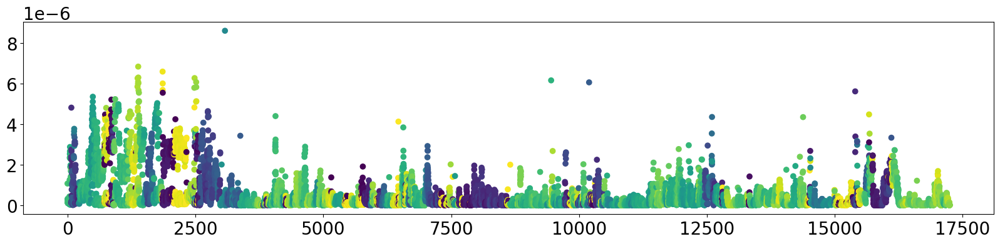

In [ ]:
for column in X.columns:
    print(column)
    plt.figure(figsize=(20,4))
    plt.scatter(range(len(knowledge)), knowledge, c= X[column].loc[y.index])
    #plt.axvline(x=X_test.index[0], color='k', linestyle='--')
    plt.show()

Sea_water_temperature


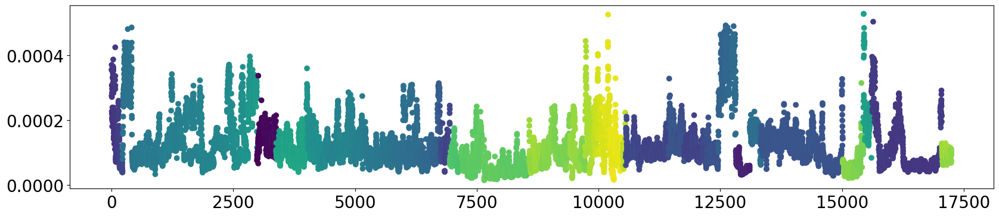

Wave_height


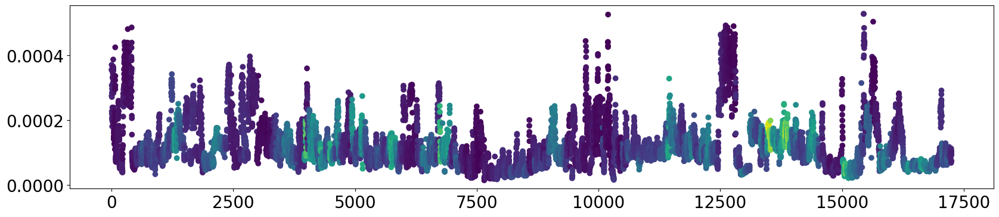

Tide_TAW


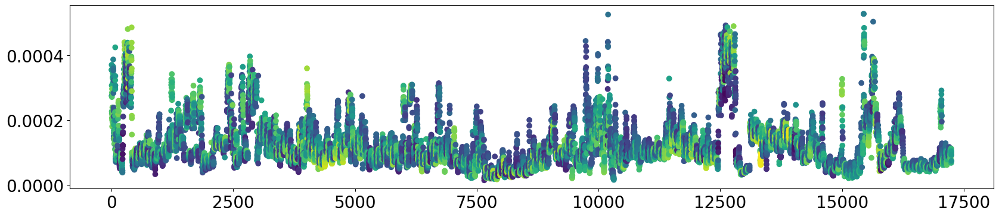

Average_wave_period


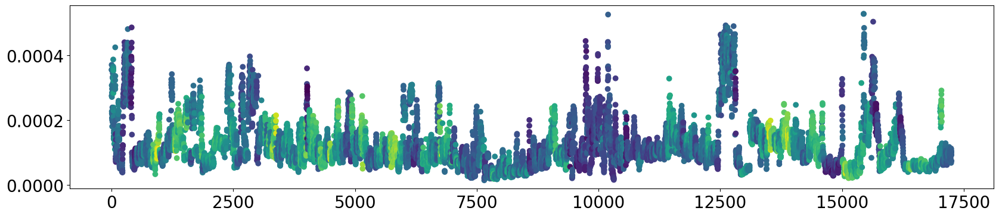

mean_BB_C01_rpm


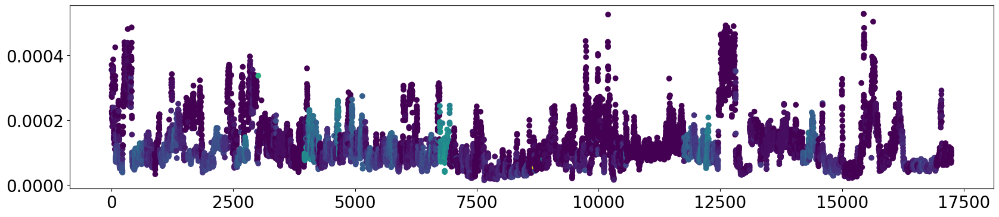

mean_BB_C01_yaw


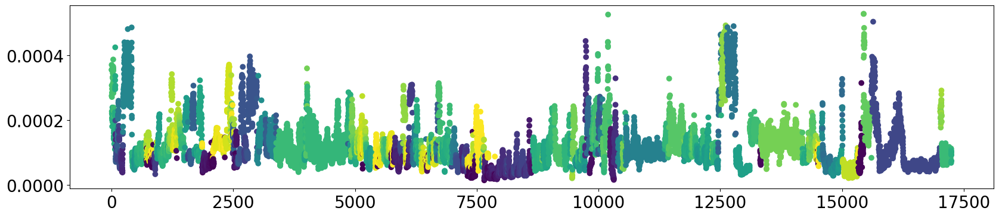

mean_BB_C01_pitch


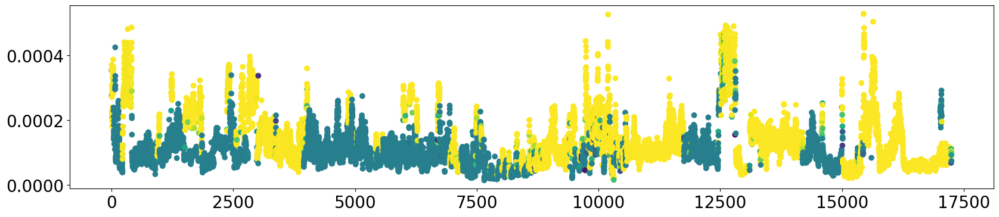

mean_BB_C01_power


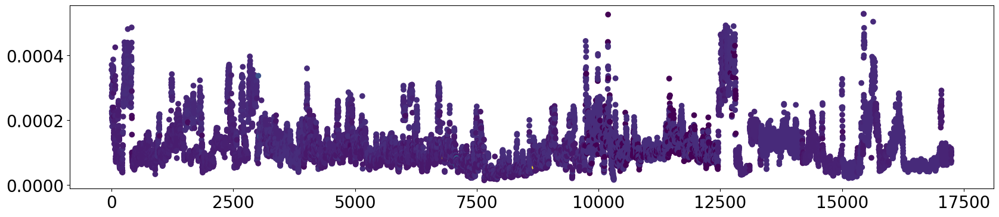

mean_BB_C01_windspeed


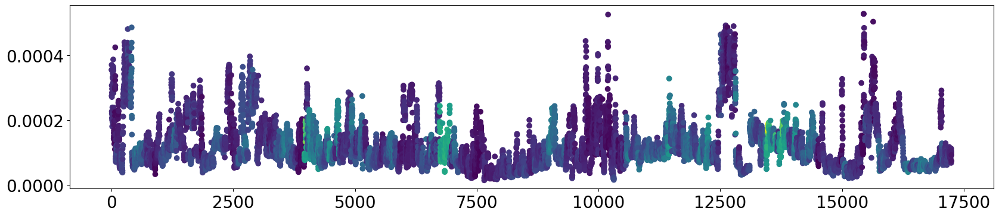

mean_BB_C01_winddirection


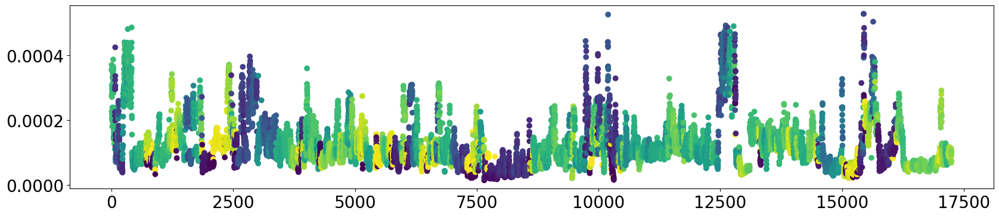

In [ ]:
for column in X.columns:
    print(column)
    plt.figure(figsize=(20,4))
    plt.scatter(range(len(data)), data, c= X[column].loc[y.index])
    #plt.axvline(x=X_test.index[0], color='k', linestyle='--')
    plt.show()